# NVIDIA DGX Spark 本地视觉 Agent 技能开发实战

> 分享人：NVIDIA 开发者社区经理 何琨  
> 技术栈：DGX Spark + OpenClaw + NVIDIA Agent Skills + TAO + Qwen3.6

本 Workshop 只讲三项 Skill：

1. 安装并在 OpenClaw 中使用 NVIDIA 官方 `tao-generate-image-grounding`。
2. 安装并在 OpenClaw 中使用 NVIDIA 官方 `tao-generate-referring-expressions`。
3. 参考前两个 GitHub Skill，创建、安装并使用自己的 `local-pedestrian-detector`。

所有推理在 DGX Spark 本地完成，模型默认从魔搭社区下载。

## 0. 先打开 OpenClaw

Workshop 开始后先打开 OpenClaw，并把它放在 Notebook 旁边。后续每个环节都先复制提示词到 OpenClaw，再回到 Notebook 查看对应的预期效果和现场结果。

如果尚未启动完整环境，先在终端运行：

```bash
cd /home/nvidia/dgx_spark_visual_agent_skills_demo
./start.sh
```

运行下一格会启动全部服务、清理旧的 `workspace/runs/`，把教学环境重置为“仅两个官方 Skill”，并生成带当前 token 的可点击链接。

In [2]:
from pathlib import Path
import subprocess
from IPython.display import Markdown, display

ROOT = Path.cwd().resolve()
# 先启动模型、OpenClaw 和 Jupyter，再把教学环境重置为“仅两个官方 Skill”。
subprocess.run(["bash", "start.sh"], cwd=ROOT, check=True, text=True)
subprocess.run(
    ["bash", "scripts/reset-workshop.sh"],
    cwd=ROOT, check=True, text=True,
)
token_file = ROOT / "openclaw/.secrets/gateway-token"
token = token_file.read_text().strip()
openclaw_url = f"http://localhost:13200/#token={token}"
display(Markdown(f"### [点击这里打开 OpenClaw]({openclaw_url})"))
print("OpenClaw Gateway 已就绪：127.0.0.1:13200")

NVIDIA DGX Spark Visual Agent Demo
启动模式: local
本脚本不会创建 systemd、cron 或桌面开机启动项。
模型清单正常：42 个分片，37.46 GB
[正常] Qwen 已运行
[正常] OpenClaw 已运行
[正常] Jupyter 已运行
[正常] Qwen ready (Qwen/Qwen3.6-35B-A3B-FP8)
[正常] OpenClaw 运行中 (PID 74234, :13200)
[正常] Jupyter 运行中 (PID 74448, :18900)

服务已由手动启动脚本开启。访问地址：
本机: http://localhost:13200/#token=x5QiUEO9fUjGRNbTtiHIR-ialKwkNbXBdmecUNme4S4
SSH:  ssh -N -L 13200:127.0.0.1:13200 nvidia@192.168.8.117
LAN:  http://192.168.8.117:13200/#token=x5QiUEO9fUjGRNbTtiHIR-ialKwkNbXBdmecUNme4S4
http://localhost:18900/lab/tree/workshop.ipynb?token=-mmBaOPMC7Fo6fqagdf5tt9JtJh62Csh

使用完毕后运行: /home/nvidia/dgx_spark_visual_agent_skills_demo/stop-demo.sh
[正常] 已安装 NVIDIA Skill: tao-generate-image-grounding
[正常] 已安装 NVIDIA Skill: tao-generate-referring-expressions
[正常] 官方 Skill 来源已固定到 https://github.com/NVIDIA/skills/commit/8b9f1ed9a9d3d2dc6199ce8764932c85abeed7f0
/home/nvidia/dgx_spark_visual_agent_skills_demo/workspace/inbox/multi-object.png
/home/nvidia/dgx_spark_visual_agent_skill

### [点击这里打开 OpenClaw](http://localhost:13200/#token=x5QiUEO9fUjGRNbTtiHIR-ialKwkNbXBdmecUNme4S4)

OpenClaw Gateway 已就绪：127.0.0.1:13200


## Workshop 路线

```text
安装 NVIDIA/skills
  → OpenClaw 发现官方 Skill
  → 官方 Skill 1：图片 + caption → 开放词汇边界框
  → 官方 Skill 2：图片 + KITTI 框 → 区域描述、空间关系、框核验
  → 阅读官方 Skill 的触发条件、运行契约和护栏
  → 创建 local-pedestrian-detector
  → 安装到 OpenClaw
  → 默认提示词 → 行人数量 + 带框图片
```

Skill 是版本化的任务操作手册，不是另一个模型。OpenClaw 负责选择 Skill，TAO 提供 `auto_label` 工作流，Qwen3.6 提供本地多模态推理。

In [3]:
from pathlib import Path
import json, os, subprocess, sys
from IPython.display import Image, Markdown, display

PROJECT_ROOT = Path.cwd().resolve()
assert PROJECT_ROOT.name == "dgx_spark_visual_agent_skills_demo", PROJECT_ROOT
WORKSPACE = PROJECT_ROOT / "workspace"
MULTI_OBJECT = WORKSPACE / "inbox" / "multi-object.png"
PEDESTRIANS = WORKSPACE / "inbox" / "pedestrians.png"
OPENCLAW = PROJECT_ROOT / "openclaw" / "bin" / "openclaw"

os.environ.update({
    "PROJECT_ROOT": str(PROJECT_ROOT),
    "WORKSPACE_ROOT": str(WORKSPACE),
    "VENV_DIR": str(PROJECT_ROOT / ".venv"),
    "QWEN_BASE_URL": "http://127.0.0.1:18200/v1",
    "QWEN_SERVED_NAME": "Qwen/Qwen3.6-35B-A3B-FP8",
})

def run(*args, timeout=1800, show=True):
    result = subprocess.run(
        [str(x) for x in args], cwd=PROJECT_ROOT,
        text=True, capture_output=True, timeout=timeout
    )
    if show and result.stdout:
        print(result.stdout)
    if result.stderr:
        print(result.stderr, file=sys.stderr)
    if result.returncode:
        raise RuntimeError(f"command failed ({result.returncode}): {args}")
    return result

def show_prompt(prompt):
    display(Markdown(f"```text\n{prompt}\n```"))

print("项目：", PROJECT_ROOT)
print("后续单元不会创建隐藏 CLI 会话；所有提示词都在刚才打开的 OpenClaw 页面执行。")

项目： /home/nvidia/dgx_spark_visual_agent_skills_demo
后续单元不会创建隐藏 CLI 会话；所有提示词都在刚才打开的 OpenClaw 页面执行。


## 示例图片

两张图片均由分享者使用 ChatGPT 按下列提示词生成，不由项目脚本生成。

**多目标图片提示词摘要：**写实城市公园入口，三名行人、两辆自行车、小狗、长椅、红色背包、蓝色汽车和交通锥，目标清晰且不严重重叠。

**行人图片提示词摘要：**写实城市步行街，六名远近和遮挡程度不同的行人，不添加框、编号、水印或可读招牌。

第一张供两个官方 Skill 使用，第二张供第三个自研 Skill 使用。

### 官方 Skill 示例图

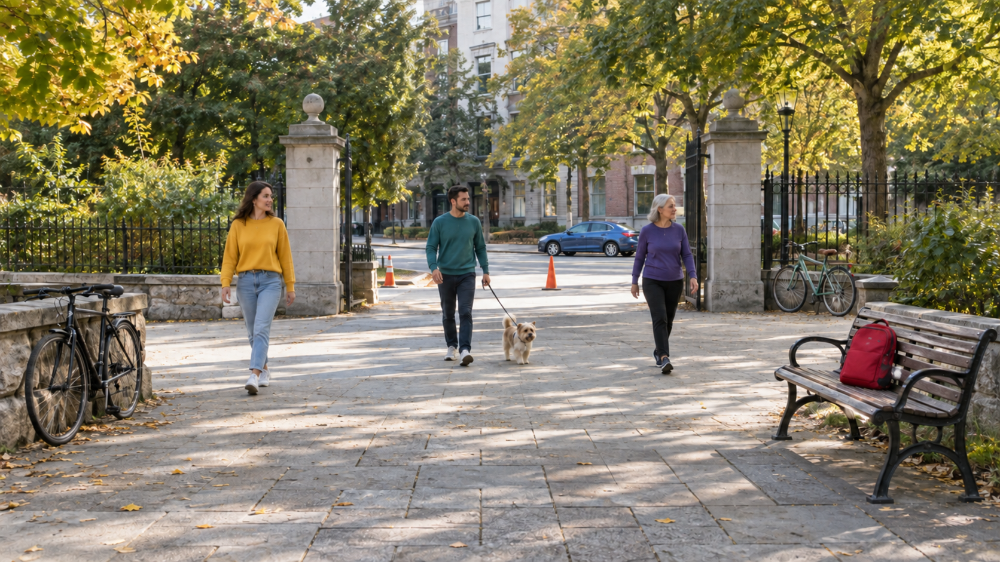

### 自研行人检测 Skill 示例图

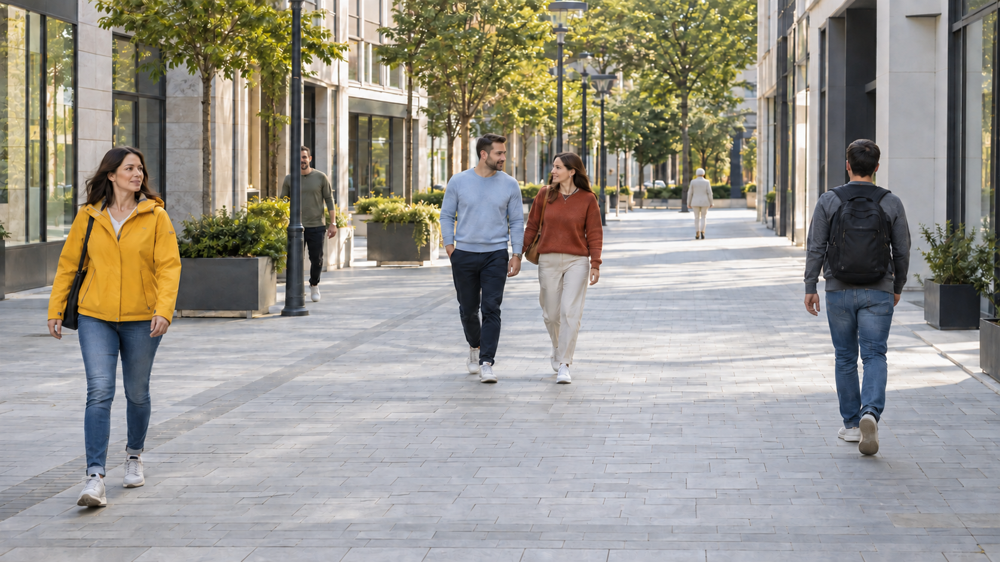

In [4]:
assert MULTI_OBJECT.is_file() and PEDESTRIANS.is_file()
display(Markdown("### 官方 Skill 示例图"))
display(Image(filename=str(MULTI_OBJECT), width=800))
display(Markdown("### 自研行人检测 Skill 示例图"))
display(Image(filename=str(PEDESTRIANS), width=800))

## 1. 安装 NVIDIA 官方 Skill

官方入口是 [`NVIDIA/skills`](https://github.com/NVIDIA/skills)。通用编码 Agent 可以使用：

```bash
npx skills@latest add nvidia/skills --skill tao-generate-image-grounding
npx skills@latest add nvidia/skills --skill tao-generate-referring-expressions
```

当前 `skills` CLI 没有专门的 OpenClaw target，因此本项目采用可审计方式：

1. 固定 NVIDIA/skills 提交 `8b9f1ed9...`。
2. 保存两个完整、未修改的官方 Skill 到 `vendor/nvidia-skills/`。
3. 安装时复制到项目专属 `workspace/skills/`。
4. 用 OpenClaw 自己的命令验证 Skill 已加载。

这样不会写入全局目录，也不会受现场 GitHub 网络影响。

安装完成后可在刚才打开的 OpenClaw 新建对话并输入：

> 请列出当前已安装的 NVIDIA 官方视觉 Skill，并分别用一句话说明用途。

此时第三个 Skill 尚未创建，预期只返回：`tao-generate-image-grounding` 和 `tao-generate-referring-expressions`。

In [5]:
# 安装两个固定版本的官方 Skill，并检查 OpenClaw 可见性。
run("bash", "scripts/install-nvidia-skills.sh")
result = run("bash", "-lc", "source ./env.sh && openclaw skills list --eligible --json", show=False)
skills = json.loads(result.stdout)["skills"]
for skill in skills:
    print(f"READY  {skill['name']}  <- {skill['source']}")

[正常] 已安装 NVIDIA Skill: tao-generate-image-grounding
[正常] 已安装 NVIDIA Skill: tao-generate-referring-expressions
[正常] 官方 Skill 来源已固定到 https://github.com/NVIDIA/skills/commit/8b9f1ed9a9d3d2dc6199ce8764932c85abeed7f0

READY  tao-generate-image-grounding  <- openclaw-workspace
READY  tao-generate-referring-expressions  <- openclaw-workspace


## 2. 本地模型与服务状态

模型为魔搭官方 `Qwen/Qwen3.6-35B-A3B-FP8`。项目不使用 `--language-model-only`，保留图片输入能力。

DGX Spark GB10 上显式禁用不兼容的 DeepGEMM，并固定 Triton FP8 MoE：

```text
VLLM_USE_DEEP_GEMM=0
--moe-backend triton
```

模型与 OpenClaw 已在开头启动。下一格只检查状态，避免演讲过程中重复启动服务。

In [6]:
run("bash", "scripts/ctl.sh", "status")

[正常] Qwen ready (Qwen/Qwen3.6-35B-A3B-FP8)
[正常] OpenClaw 运行中 (PID 74234, :13200)
[正常] Jupyter 运行中 (PID 74448, :18900)



CompletedProcess(args=['bash', 'scripts/ctl.sh', 'status'], returncode=0, stdout='[正常] Qwen ready (Qwen/Qwen3.6-35B-A3B-FP8)\n[正常] OpenClaw 运行中 (PID 74234, :13200)\n[正常] Jupyter 运行中 (PID 74448, :18900)\n', stderr='')

## 3. 官方 Skill 1：Image Grounding

`tao-generate-image-grounding` 的输入是图片和 caption，输出 referring expressions 及像素边界框。

安装目录：

```text
workspace/skills/tao-generate-image-grounding/
├── SKILL.md
├── references/
├── evals/
├── BENCHMARK.md
└── skill-card.md
```

复制到当前 OpenClaw 对话：

> 使用 NVIDIA 官方 tao-generate-image-grounding 分析 inbox/multi-object.png。只定位 person、bicycle、dog、backpack、car 五类目标，不要分析树木、道路、阳光、阴影或建筑；返回简短摘要。最后一行必须原样输出工具结果中的 `MEDIA:/绝对路径`，该行不得放进代码块、反引号、列表或表格；不要用 view_image 代替图片回传。

预计耗时：约 60–120 秒。预期最多约 8 个框，不再给整片道路、树冠和阳光画框。

In [7]:
grounding_skill = PROJECT_ROOT / "workspace/skills/tao-generate-image-grounding/SKILL.md"
display(Markdown("\n".join(grounding_skill.read_text().splitlines()[:45])))

---
name: tao-generate-image-grounding
description: "Two-step image grounding pipeline: extracts referring expressions from (image, caption) pairs and grounds them
  to pixel-space bounding boxes via a VLM. Use when the user wants to ground captions to bboxes, generate phrase-grounded
  annotations, auto-label images for grounding, or run the image_grounding pipeline. Triggers include 'image grounding',
  'phrase grounding', 'ground captions', 'auto-label image grounding', 'image_grounding'."
license: Apache-2.0
compatibility: Requires docker + nvidia-container-toolkit + at least one VLM endpoint (Gemini API key or OpenAI-compatible).
metadata:
  author: NVIDIA Corporation
  version: "0.1.0"
allowed-tools: Read Bash Write
tags:
  - image
  - grounding
  - bounding-boxes
  - auto-label
  - vlm
  - 2d-grounding
---

# Image Grounding Pipeline

> **Standalone install?** If this session was not initialized by the TAO skill bank plugin, run the `tao-setup` skill first (host preflight, credentials, cross-skill discovery).

Turn `(image, caption)` pairs into per-image grounded annotations: cleaned captions, referring expressions with character spans, and pixel-space bounding boxes for each expression. A single VLM (Gemini or any OpenAI-compatible endpoint) handles both steps.

## Purpose

Generate phrase-grounded training data for referring-expression and grounding models. The VLM acts as a "teacher" annotator: Step 0 extracts referring expressions from the caption while looking at the image; Step 1 returns one bbox set per expression for each image.

## Pipeline Architecture

```
Step 0: Expression extraction  → VLM cleans caption, extracts referring expressions + char spans
Step 1: Phrase grounding       → VLM returns pixel bboxes + scores per expression
```

Steps are individually selectable via `workflow.steps`. Each step writes a per-sample checkpoint to `step_<N>_*/.ckpt/<sample_id>.json` and skips already-processed records on re-run. Set `workflow.force_reprocess: true` to ignore checkpoints and reprocess from scratch.

## Instructions

### Initial setup

When a user wants to run this pipeline, walk through these steps:

### 返回效果示例

OpenClaw 会返回类似结果：

```text
Image Grounding 已完成。
代表性目标：
- 黄色上衣行人：[217, 321, 298, 704]
- 绿色上衣行人：[423, 329, 492, 652]
- 左侧自行车：[22, 517, 144, 785]
- 小狗：[499, 568, 550, 650]
- 长椅上的红色背包：[835, 565, 900, 695]

原始 JSON 已保存到 grounding/annotations.jsonl。
带框图片已附加到本条回复。
```

下面是预先验证过的效果图；再运行下一格可执行一次实时 OpenClaw 调用。

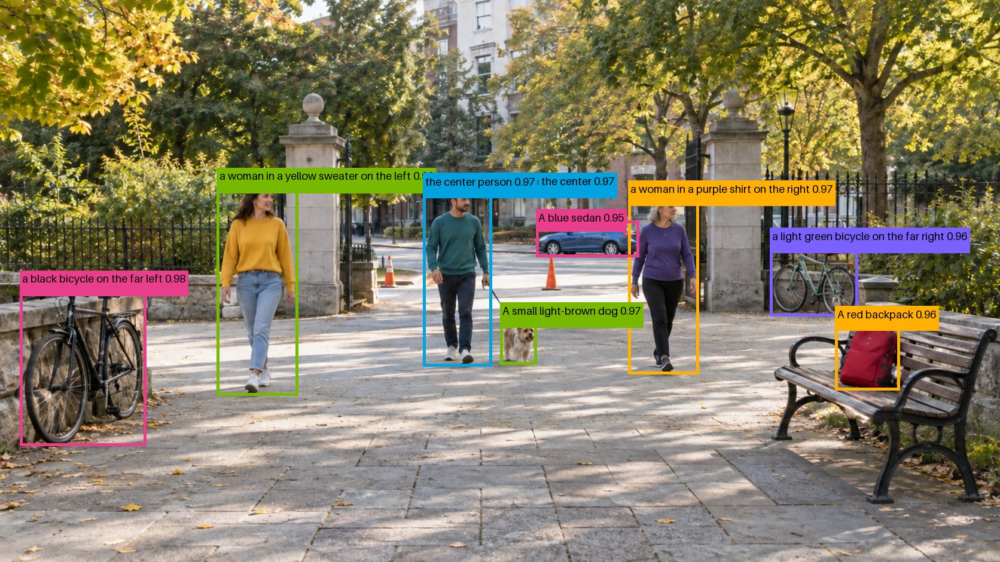

In [8]:
display(Image(
    filename=str(PROJECT_ROOT / "assets/examples/01-grounding-result.png"),
    width=900,
))

In [9]:
GROUNDING_PROMPT = (
    "使用 NVIDIA 官方 tao-generate-image-grounding 分析 inbox/multi-object.png。"
    "只定位 person、bicycle、dog、backpack、car 五类目标，不要分析树木、道路、"
    "阳光、阴影或建筑；返回简短摘要。最后一行必须原样输出工具结果中的 "
    "MEDIA:/绝对路径，该行不得放进代码块、反引号、列表或表格；"
    "不要用 view_image 代替图片回传。"
)
show_prompt(GROUNDING_PROMPT)
print("请把上面的提示词复制到当前 OpenClaw 对话；完成后再继续下一节。")

```text
使用 NVIDIA 官方 tao-generate-image-grounding 分析 inbox/multi-object.png。只定位 person、bicycle、dog、backpack、car 五类目标，不要分析树木、道路、阳光、阴影或建筑；返回简短摘要。最后一行必须原样输出工具结果中的 MEDIA:/绝对路径，该行不得放进代码块、反引号、列表或表格；不要用 view_image 代替图片回传。
```

请把上面的提示词复制到当前 OpenClaw 对话；完成后再继续下一节。


## 4. 官方 Skill 2：Referring Expressions

`tao-generate-referring-expressions` 接收图片和 KITTI 边界框，依次生成：

1. 每个区域的可区分描述。
2. 整图 caption。
3. 带空间关系的指代表达。
4. 对边界框进行二次视觉核验。

在同一个 OpenClaw 对话继续输入：

> 使用 NVIDIA 官方 tao-generate-referring-expressions 继续处理刚才的 grounding 结果。只描述并核验已经选中的人物、自行车、小狗、背包和汽车，不新增背景区域；最多返回五条代表性描述。最后一行必须原样输出工具结果中的 `MEDIA:/绝对路径`，不得使用代码块或反引号；不要用 view_image 代替图片回传。

预计耗时：约 45–90 秒。预期效果：把“目标在哪里”升级为“如何用语言唯一指向目标”，同时保持画面整洁。

In [10]:
referring_skill = PROJECT_ROOT / "workspace/skills/tao-generate-referring-expressions/SKILL.md"
display(Markdown("\n".join(referring_skill.read_text().splitlines()[:48])))

---
name: tao-generate-referring-expressions
description: "Four-step image referring-expression pipeline: turns images plus KITTI bounding-box labels into region
  descriptions, scene captions, grounded referring expressions, and (optionally) verified expressions via VLM distillation. Use
  when the user wants to generate referring-expression annotations from images with KITTI labels, build region descriptions,
  produce grouped grounding phrases tied to bboxes, run a double-check verification pass on grounding expressions, auto-label
  traffic / scene images for referring datasets, or run the image_referring_expression pipeline. Triggers include 'referring
  expression', 'region description', 'KITTI labels', 'spatial relationship annotation', 'auto-label image referring expression',
  'image_referring_expression'."
license: Apache-2.0
compatibility: Requires docker + nvidia-container-toolkit + at least one VLM endpoint (Gemini API key or OpenAI-compatible).
metadata:
  author: NVIDIA Corporation
  version: "0.1.0"
tags:
  - image
  - referring-expression
  - kitti
  - bounding-boxes
  - auto-label
  - vlm
allowed-tools: Read Bash Write
---

# Image Referring Expression Pipeline

> **Standalone install?** If this session was not initialized by the TAO skill bank plugin, run the `tao-setup` skill first (host preflight, credentials, cross-skill discovery).

Generate referring-expression and grounding annotations from images with KITTI-format bounding box labels. A single VLM (Gemini or any OpenAI-compatible endpoint) runs four steps: per-object region descriptions, holistic image captions, grouped grounding expressions tied to bboxes, and an optional double-check verification pass.

## Purpose

Transform `(image, KITTI labels)` pairs into a unified `annotations.jsonl` containing rich, grounded referring expressions. The VLM acts as a "teacher" annotator: Steps 0-1 see the image; Step 2 groups Step 0 outputs into grouping phrases with bbox lists; Step 3 (optional) re-examines those bboxes against the image and corrects mismatches.

## Pipeline Architecture

```
Step 0: Region expression  ──┐
                              ├──▶  Step 2: Grounding expression  ──▶  [Step 3: Double check]
Step 1: Image caption  ──────┘                                                   (optional)
```

- **Step 0 (region_expr)** — VLM emits one short discriminative phrase per KITTI bbox (`bbox_2d`, `type`, `color`, `description`).
- **Step 1 (image_caption)** — VLM emits a holistic, location-agnostic scene caption.
- **Step 2 (grounding_expr)** — VLM groups Step 0 objects into grouping phrases and returns one bbox list per group, optionally using Step 1's caption as extra context.
- **Step 3 (double_check)** — VLM re-checks each Step 2 bbox against the image; bad matches are removed, slightly-off boxes get tightened.

Steps 0 and 1 run in parallel within a single thread pool (they only depend on the seed records). Each step writes its own `step_<N>_*/annotations.jsonl` and skips already-processed images on re-run unless `workflow.force_reprocess: true`.

### 返回效果示例

OpenClaw 会返回类似结果：

```text
Referring Expressions 四步流程已完成。
- 黄色毛衣女士：在画面左侧沿石板路行走。
- 绿色上衣男士：位于画面中央并牵着一只小狗。
- 两辆自行车：分别停放在入口左、右两侧。
- 两个交通锥：位于石柱后方的道路入口。
- 红色背包：放在画面右侧的木质长椅上。

以上表达已完成 double_check，详细结果保存于
referring/annotations.jsonl。
```

下面是区域描述与核验框的示例图。

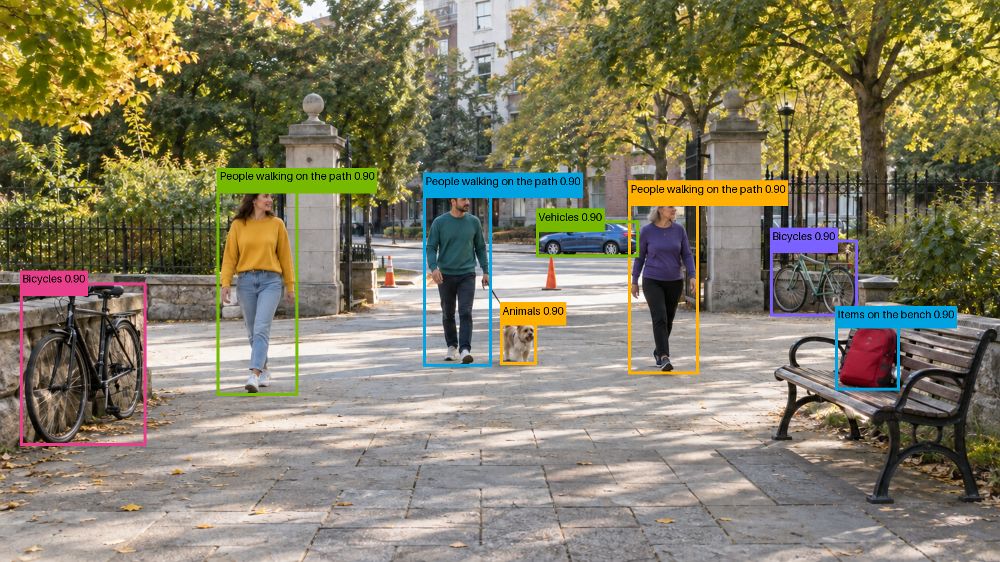

In [11]:
display(Image(
    filename=str(PROJECT_ROOT / "assets/examples/02-referring-result.png"),
    width=900,
))

In [12]:
REFERRING_PROMPT = (
    "使用 NVIDIA 官方 tao-generate-referring-expressions 继续处理刚才的 "
    "grounding 结果。只描述并核验已经选中的人物、自行车、小狗、背包和汽车，"
    "不新增背景区域；最多返回五条代表性描述。最后一行必须原样输出工具结果中的 "
    "MEDIA:/绝对路径，不得使用代码块或反引号；不要用 view_image 代替图片回传。"
)
show_prompt(REFERRING_PROMPT)
print("请在刚才同一个 OpenClaw 对话继续发送这段提示词。")

```text
使用 NVIDIA 官方 tao-generate-referring-expressions 继续处理刚才的 grounding 结果。只描述并核验已经选中的人物、自行车、小狗、背包和汽车，不新增背景区域；最多返回五条代表性描述。最后一行必须原样输出工具结果中的 MEDIA:/绝对路径，不得使用代码块或反引号；不要用 view_image 代替图片回传。
```

请在刚才同一个 OpenClaw 对话继续发送这段提示词。


## 5. 从 GitHub 官方 Skill 创建自己的 Skill

先从两个官方 Skill 提取可复用结构：

- frontmatter：`name`、`description`、`license`、运行依赖。
- 触发条件：用户说什么时应该选择它。
- 输入契约：单张图片、附件路径和格式限制。
- 工作流：Grounding → Referring Expressions → 业务后处理。
- 输出契约：JSON、标注图，以及 OpenClaw 的 `MEDIA:` 图片附件。
- Guardrails：只报告可见证据，不推断身份或敏感属性。

自研源码放在 `skills-src/local-pedestrian-detector/`，安装结果放在 `workspace/skills/`。这样 Notebook 能完整展示“开发 → 安装 → 使用”，而不是一开始就假设 Skill 已存在。

完整逐步说明见 `docs/CUSTOM_SKILL_GUIDE.md`。

### 创建 Skill 的开发提示词

可以把下面提示词交给 OpenClaw 或其他编码 Agent：

> 请参考已安装的 `tao-generate-image-grounding` 和 `tao-generate-referring-expressions`，在 `workspace/drafts/local-pedestrian-detector/` 创建一个新的 OpenClaw Skill 草稿。不得修改 `workspace/skills/` 中任何已安装 Skill，也不得覆盖项目脚本。它接收一张本地图片，调用两个官方 Skill 获取并复核边界框，只保留 person/man/woman/pedestrian 类表达，使用 IoU 去重，把坐标映射回原图，输出 `pedestrians.json` 和带绿色边界框的 `pedestrians-annotated.jpg`。最终回复最后一行必须是未格式化的 `MEDIA:/绝对路径`。禁止推断身份、国籍、年龄、关系和意图。

预期生成：

```text
workspace/drafts/local-pedestrian-detector/
├── SKILL.md                 # 触发条件、执行入口、输出协议、护栏
└── scripts/
    ├── run.sh               # 编排两个官方 Skill
    └── pedestrian_detect.py # 筛选、去重、坐标映射和画框
```

草稿用于讲解和比较，不直接执行。下一格展示经过人工复核及实机验证的正式源码，随后再安装到 `workspace/skills/`。

In [13]:
skill_source = PROJECT_ROOT / "skills-src/local-pedestrian-detector"
for path in sorted(skill_source.rglob("*")):
    if path.is_file():
        print(path.relative_to(PROJECT_ROOT))

display(Markdown((skill_source / "SKILL.md").read_text()))

skills-src/local-pedestrian-detector/SKILL.md
skills-src/local-pedestrian-detector/scripts/__pycache__/pedestrian_detect.cpython-312.pyc
skills-src/local-pedestrian-detector/scripts/pedestrian_detect.py
skills-src/local-pedestrian-detector/scripts/run.sh


---
name: local-pedestrian-detector
description: "Detect and draw boxes around pedestrians in one attached or local image using NVIDIA TAO grounding skills and the local Qwen model. Use when the user asks to detect, count, locate, or annotate people, persons, pedestrians, men, women, or tourists in an image."
license: Apache-2.0
metadata:
  author: NVIDIA Developer Community demo
  version: "1.0.0"
  openclaw:
    requires:
      bins: ["bash", "python3", "docker", "flock"]
---

# Local Pedestrian Detector

This skill composes two unmodified NVIDIA Agent Skills:

1. `tao-generate-image-grounding` locates every separately described person.
2. `tao-generate-referring-expressions` describes and verifies the regions.

The local adapter filters person expressions, removes duplicate boxes, maps
coordinates back to the original image, and renders a green box around each
pedestrian. This is open-vocabulary VLM grounding, not a deterministic
YOLO/RT-DETR measurement.

## Run

Use exactly one image:

- For a workspace image: use its path below `inbox/`.
- For an OpenClaw attachment: use the exact local attachment path provided in
  the current message context. Do not reuse an older attachment.

Execute once with `yieldMs=120000` and `timeoutSeconds=1800`:

```bash
cd "$WORKSPACE_ROOT" && \
  bash skills/local-pedestrian-detector/scripts/run.sh <image-path>
```

If it backgrounds, use `process poll` with `timeout=120000` until
`PEDESTRIAN_DETECTION_RESULT_END`. Never start a duplicate run.

## Final response

Read `pedestrians.json`, report the count and preserve the limitation. Then
attach the rendered image in the OpenClaw interface by ending the final answer
with this standalone, unformatted raw line using the exact `annotated_image`
path:

```text
MEDIA:<absolute-path-to-pedestrians-annotated.jpg>
```

`view_image` loads media only into private model context; it does not display
the image to the user. Do not use it as a substitute for delivery.

Do not wrap the `MEDIA:` line in Markdown, a code fence, backticks, bold text,
a blockquote, list, table, heading, or prose. Put one blank line before it and
make it the final non-whitespace line. Do not replace it with a normal path
link.

## Guardrails

- Do not infer identity, nationality, age, relationship, intent, or protected
  attributes.
- Only count boxes supported by the two official Skill outputs.
- Preserve partially occluded/background detections and their confidence.
- Do not call an online model or web service.
- Do not modify either NVIDIA official Skill directory.


### 自研 Skill 做了什么

官方 Skill 保持原样，自研部分只增加业务编排：

1. 为每个可见行人生成有位置和服装特征的 caption。
2. 调用官方 Image Grounding 获取候选框。
3. 调用官方 Referring Expressions 描述并复核区域。
4. 筛选 person/man/woman/pedestrian 表达。
5. 用 IoU 去除重复框，并将 0–1000 坐标映射回原图。
6. 输出 `pedestrians.json` 和 `pedestrians-annotated.jpg`。
7. 用独立 `MEDIA:` 行让 OpenClaw 在聊天中直接显示图片。

In [14]:
# 将自研源码安装到 OpenClaw workspace，再验证 OpenClaw 已识别。
run("bash", "scripts/install-custom-skill.sh")
result = run("bash", "-lc", "source ./env.sh && openclaw skills list --eligible --json", show=False)
for skill in json.loads(result.stdout)["skills"]:
    print(f"READY  {skill['name']}")

[正常] 自研 Skill 已安装: /home/nvidia/dgx_spark_visual_agent_skills_demo/workspace/skills/local-pedestrian-detector
OpenClaw 已识别 local-pedestrian-detector

READY  local-pedestrian-detector
READY  tao-generate-image-grounding
READY  tao-generate-referring-expressions


## 6. 在 OpenClaw 中使用自研 Skill

推荐默认提示词：

> 检测 inbox/pedestrians.png 中的所有行人，包括远处和部分遮挡的行人；画出边界框并告诉我检测数量。不要判断人物身份、国籍、年龄或关系。最后一行必须原样输出工具结果中的 `MEDIA:/绝对路径`，不得放入代码块、反引号、列表或表格；不要用 view_image 代替图片回传。

可以演示提示词如何改变效果：

- **全部行人**：包括远处和部分遮挡者，召回更多候选框。
- **仅近景行人**：忽略远处小目标，画面更简洁。
- **只返回结构化结果**：不显示图片，只返回 bbox JSON，方便下游程序消费。

默认效果：OpenClaw 自动选择 `local-pedestrian-detector`，等待本地 TAO 流程结束，报告检测数量并直接显示绿色行人框图片。

### 返回效果示例

使用默认提示词，在 `pedestrians.png` 上实测返回：

```text
行人检测完成。
检测数量：6
- Person 1：左侧近景
- Person 2：被路灯部分遮挡
- Person 3、4：中央并排行走
- Person 5：远处小目标
- Person 6：右侧背包行人

JSON：final/pedestrians.json
标注图：final/pedestrians-annotated.jpg
```

OpenClaw 回复末尾的 `MEDIA:` 会把下图作为聊天附件直接显示。

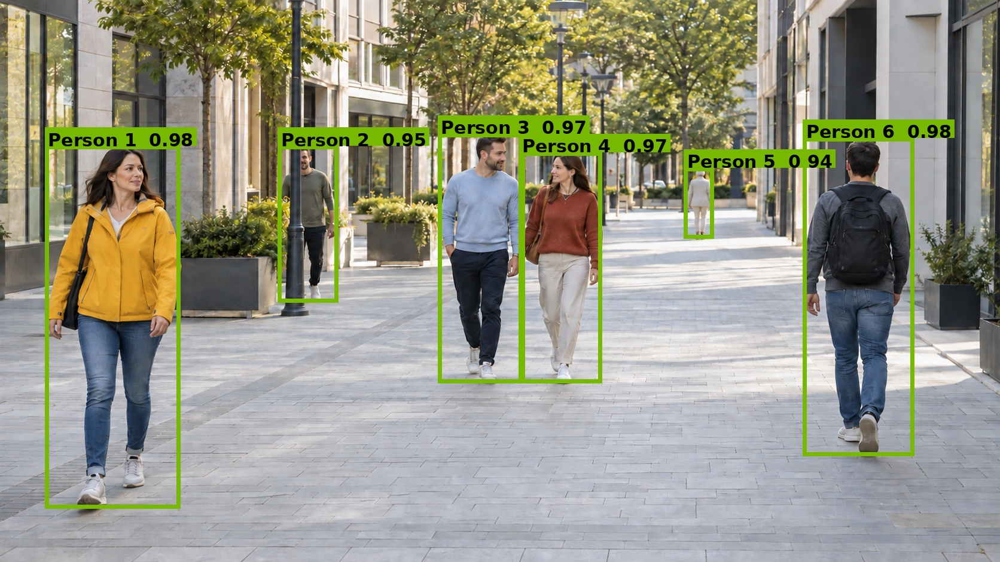

In [15]:
display(Image(
    filename=str(PROJECT_ROOT / "assets/examples/03-pedestrian-result.jpg"),
    width=900,
))

In [16]:
PEDESTRIAN_PROMPT = (
    "检测 inbox/pedestrians.png 中的所有行人，包括远处和部分遮挡的行人；"
    "画出边界框并告诉我检测数量。不要判断人物身份、国籍、年龄或关系。"
    "最后一行必须原样输出工具结果中的 MEDIA:/绝对路径，不得放入代码块、"
    "反引号、列表或表格；不要用 view_image 代替图片回传。"
)
show_prompt(PEDESTRIAN_PROMPT)
print("请复制到当前 OpenClaw 对话。预计耗时约 90–150 秒，实测返回 6 个行人框。")

```text
检测 inbox/pedestrians.png 中的所有行人，包括远处和部分遮挡的行人；画出边界框并告诉我检测数量。不要判断人物身份、国籍、年龄或关系。最后一行必须原样输出工具结果中的 MEDIA:/绝对路径，不得放入代码块、反引号、列表或表格；不要用 view_image 代替图片回传。
```

请复制到当前 OpenClaw 对话。预计耗时约 90–150 秒，实测返回 6 个行人框。


## 7. 验证、重置与 GitHub 打包

```bash
# 快速检查安装、三项 Skill、两张图片和隔离配置
./verify.sh

# 完整验证：模型视觉输入、两个官方 Skill 的 OpenClaw 调用、
# 自研 Skill 的行人计数和聊天图片回传
./verify.sh --full

# 清理运行结果，保留模型和安装资产
scripts/ctl.sh reset

# 生成不含模型、token、日志和运行状态的 GitHub 源码包
scripts/pack.sh source
```

GitHub 项目保留：两项官方 Skill 的来源提交、自研 Skill 源码、安装脚本、示例图片及其生成提示词。

In [17]:
run(".venv/bin/python", "tests/source_checks.py")
run("bash", "scripts/ctl.sh", "status")

source checks passed

[正常] Qwen ready (Qwen/Qwen3.6-35B-A3B-FP8)
[正常] OpenClaw 运行中 (PID 74234, :13200)
[正常] Jupyter 运行中 (PID 74448, :18900)



CompletedProcess(args=['bash', 'scripts/ctl.sh', 'status'], returncode=0, stdout='[正常] Qwen ready (Qwen/Qwen3.6-35B-A3B-FP8)\n[正常] OpenClaw 运行中 (PID 74234, :13200)\n[正常] Jupyter 运行中 (PID 74448, :18900)\n', stderr='')